In [1]:
"""
Alexandre
2024/10/21
"""

# Trying to simulate some activity in a range of parameters space and trying to decod it with a multinomilae logistic regression

'\nAlexandre\n2024/10/21\n'

# **Encoding and Decoding**

## Initialisation part

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import nest
import os


              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.8.0
 Built: Aug  5 2024 06:09:47

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



In [3]:
cwd = os.getcwd()
print(cwd)

results_fodler_name = "E_results"
os.makedirs(
    os.path.join(cwd, results_fodler_name),
    exist_ok=True
)

/root/EBRAIN-Fall-School/nest_project_eitn_24/Encoding_Layer_Alexandre


## First check

### network generation

In [4]:
# set general parameters
seed = 1
dt = 0.1
num_threads = 16

# initialize nest kernel
nest.ResetKernel()
nest.SetKernelStatus({
    'rng_seed': seed,
    'resolution': dt,
    'local_num_threads': num_threads
})

# general parameters
gamma = 0.25 # relative number of inhibitory

# encoding layer parameters
nEnc = 500  # number of neurons in the encoding layer
J_bias = 200. # [pA]

# main network parameters
NE = 1000 # number of excitatory neurons (10.000 in [1])
CE = 200 # indegree from excitatory neurons

# synapse parameters
w = 0.1 # excitatory synaptic weight (mV)
g = 5. # relative inhibitory to excitatory synaptic weight
d = 1.5 # synaptic transmission delay (ms)


Oct 22 01:04:27 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.


In [9]:
# create the encoding layer 1
enc_layer = nest.Create(
    model='iaf_psc_delta', 
    n=nEnc, 
    params={'I_e': J_bias}
)

# record the activity of the encoding layer 1
enc_spks = nest.Create('spike_recorder')
nest.Connect(enc_layer, enc_spks)

##### MAIN NETWORK #####
# population parameters
NI = int(gamma * NE) # number of inhibitory neurons
CI = int(gamma * CE) # indegree from inhibitory neurons

# neuron paramters
neuron_params = {
    'C_m': 1.0,            # membrane capacity (pF)
    'E_L': 0.,             # resting membrane potential (mV)
    'I_e': 0.,             # external input current (pA)
    'V_m': 0.,             # membrane potential (mV)
    'V_reset': 10.,        # reset membrane potential after a spike (mV)
    'V_th': 20.,           # spike threshold (mV)
    't_ref': 2.0,          # refractory period (ms)
    'tau_m': 20.,          # membrane time constant (ms)
}

# set default parameters for neurons and create neurons
nest.SetDefaults('iaf_psc_delta', neuron_params)
neurons_e = nest.Create('iaf_psc_delta', NE)
neurons_i = nest.Create('iaf_psc_delta', NI)

# create spike detectors
main_spks = nest.Create('spike_recorder')

# E synapses
syn_exc = {'delay': d, 'weight': w}
conn_exc = {'rule': 'fixed_indegree', 'indegree': CE}
nest.Connect(neurons_e, neurons_e, conn_exc, syn_exc)
nest.Connect(neurons_e, neurons_i, conn_exc, syn_exc)

# I synapses
syn_inh = {'delay': d, 'weight': - g * w}
conn_inh = {'rule': 'fixed_indegree', 'indegree': CI}
nest.Connect(neurons_i, neurons_e, conn_inh, syn_inh)
nest.Connect(neurons_i, neurons_i, conn_inh, syn_inh)

# spike detector
nest.Connect(neurons_e, main_spks)

# connect the encoding layer to both neuronal population
nest.Connect(enc_layer, neurons_e, conn_exc, syn_exc)
nest.Connect(enc_layer, neurons_i, conn_exc, syn_exc)

### generate input

In [5]:
# stimulus parameters
sim_time = 2_000.
frequency = 5e-3
tau = 20
scale = 2.

In [6]:
def gen_stim(
    sim_time=sim_time,
    dt=dt,
    frequency=frequency,
    scale=scale,
    tau=tau
):
    time = np.arange(dt, sim_time, dt)
    pre_sig = (np.sin(2 * np.pi * time * frequency) + 1) / 2 * scale

    noise = np.zeros_like(time)
    for t in range(len(noise)-1):
        n = np.random.randn() * 2
        noise[t+1] = (1-dt/tau)*noise[t]+ (dt*n/tau)

    sig = pre_sig + noise

    return time, sig, pre_sig

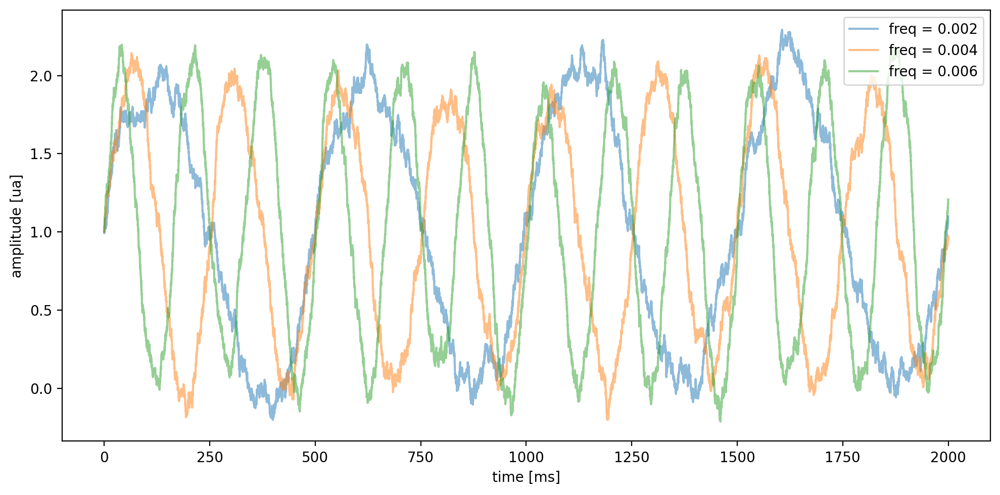

In [254]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(10,5),
    dpi=200
)

for f in [2e-3, 4e-3, 6e-3]:

    time, sig, _ = gen_stim(
        frequency=f
    )
    
    ax.plot(
        time,
        sig,
        label=f"freq = {f}",
        alpha=0.5
    )

ax.legend()
ax.set_xlabel("time [ms]")
ax.set_ylabel("amplitude [ua]")

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "input_generation_many_frequency.pdf"))
plt.show()

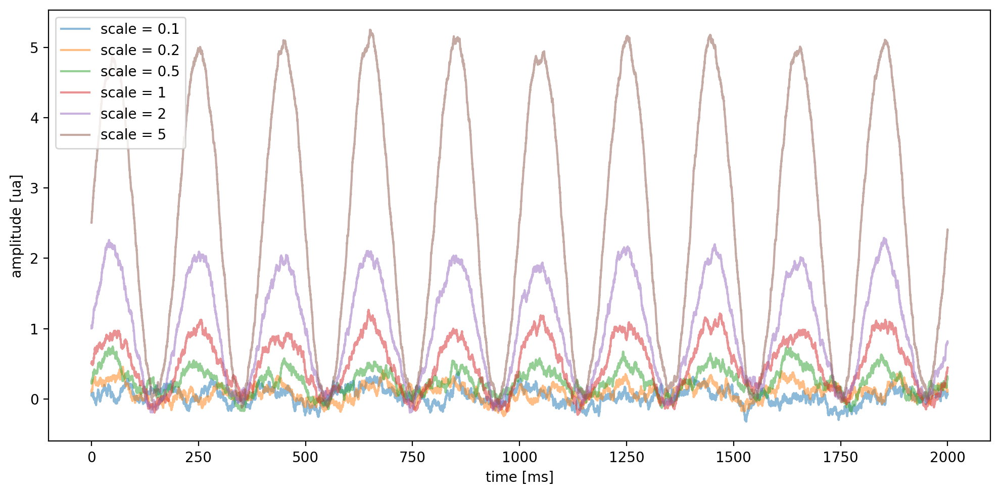

In [255]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(10,5),
    dpi=200
)

for s in [0.1, 0.2, 0.5, 1, 2, 5]:

    time, sig, pre_sig = gen_stim(
        scale=s
    )
    
    ax.plot(
        time,
        sig,
        label=f"scale = {s}",
        alpha=0.5
    )

ax.legend()
ax.set_xlabel("time [ms]")
ax.set_ylabel("amplitude [ua]")

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "input_generation_many_amplitude.pdf"))
plt.show()

### connection between input and encoding layer

In [256]:
time, sig, pre_sig = gen_stim(
    sim_time=sim_time, dt=dt,
    frequency=frequency, scale=scale,
    tau=tau
)

In [257]:
# encoding layer 1 reparametrisation
tuning = 250. * np.random.randn(nEnc) + 1000. # 
thresholds = 5 * np.random.randn(nEnc) - 50. # generate some heterogeneity on the population
thresholds = np.maximum(thresholds, -65.) # 
Vm0 = np.array(np.random.uniform(low=-70., high=-50., size=int(nEnc))) # randomized initiate point of each neuron

In [258]:
step_generator = nest.Create(
    model='step_current_generator', 
    n=nEnc
)

amplitudes = np.zeros((nEnc, len(sig)))

for n in range(nEnc): # for each neuron in the encoding layer
    
    # transform the input as function of the tuning of each neuron
    amplitudes[n, :] = sig * tuning[n]
    
    # change parameters of each neuron in the input layer
    enc_layer[n].set(
        {
            'V_m': Vm0[n], # set the membrane potential initialisation
            'V_th': thresholds[n] # set the excitation threshold
        }
    )

    # change caracteristics of the input generator
    step_generator[n].set(
        {
            'amplitude_times': time, # set the time
            'amplitude_values': amplitudes[n] # set the amplitude
        }
    )

    # connect the input generator to the encoding layer neuron one-by-one
    nest.Connect(
        step_generator[n],
        enc_layer[n]
    )

### run the simulation

In [259]:
# run the simulation
nest.Simulate(sim_time)


Oct 21 23:37:46 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:37:46 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:37:50 SimulationManager::run [Info]: 
    Simulation finished.


### extract results

In [260]:
# extract the simulation results
from utils.extractors import filter_spikes_parallel

filter_tau = 20. # [ms]

In [265]:
import pandas as pd

In [157]:
enc_activity = enc_spks.events
enc_states = filter_spikes_parallel(
    enc_activity['times'], enc_activity['senders'], # use the timing and the origin of each spike of the encoding layer
    nEnc, # total number of neuron in the encoding layer
    t_start=dt, t_stop=sim_time, dt=dt, # begin, end and time-step of the simulation
    tau=filter_tau, 
    n_processes=num_threads
)


main_activity = main_spks.events
main_states = filter_spikes_parallel(
    main_activity['times'], main_activity['senders'], 
    NE, 
    t_start=dt, t_stop=sim_time, dt=dt, 
    tau=filter_tau, 
    n_processes=num_threads
)

Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:13<00:00, 72.07it/s]


### decoding

In [158]:
from sklearn.linear_model import LinearRegression

In [159]:
def compute_capacity(x, z):
    """
    Compute capacity to reconstruct z based on linearly combining x

    Parameters
    ----------
    x : np.ndarray
        state matrix(NxT)
    z : np.ndarray
        target output (1xT)

    Returns
    -------
    z_hat : np.ndarray
        Reconstructed (predicted) signal

    """
    reg = LinearRegression(
        n_jobs=-1, 
        fit_intercept=False
    ).fit(x.T, z)
    
    W_out = reg.coef_
    z_hat = np.dot(W_out, x)

    covs = np.cov(z_hat, z)[0, 1] ** 2.0
    vars = np.var(z) * np.var(z_hat)
    capacity = covs / vars

    error = np.mean((z - z_hat) ** 2)
    return z_hat, capacity, error

In [160]:
enc_estimate, enc_capacity, enc_error = compute_capacity(enc_states, sig)
main_estimate, main_capacity, main_error = compute_capacity(main_states, sig)

print(f"Encoding Layer 1: \n\t- Capacity={enc_capacity}, MSE={enc_error}")
print(f"Main Circuit: \n\t- Capacity={main_capacity}, MSE={main_error}")

Encoding Layer 1: 
	- Capacity=0.838320131650094, MSE=0.08193647482714207
Main Circuit: 
	- Capacity=0.9187756890459635, MSE=0.048299836708711956


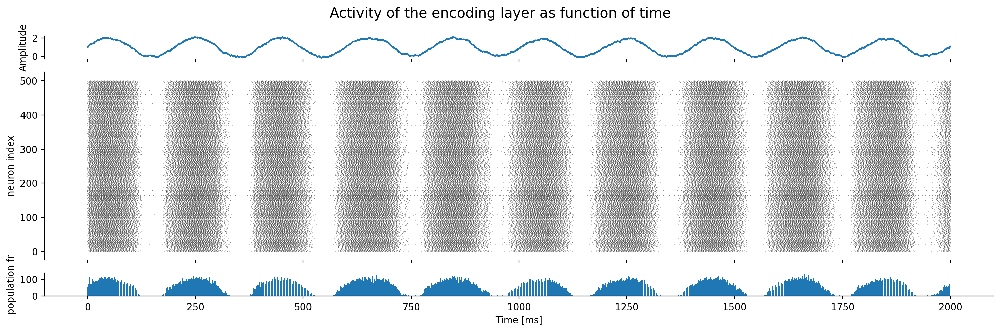

In [161]:
# graphical representation of the encoding layer spiking activity
fig,ax = plt.subplots(
    nrows=3,
    ncols=1,
    figsize=(15,5),
    dpi=200,
    gridspec_kw={"height_ratios":[0.1,0.8,0.1]},
    sharex=True
)

ax[0].plot(
    time,
    sig
)

ax[1].plot(
    enc_spks.events["times"],
    enc_spks.events["senders"],
    "|", color="black",
    markersize=1,
    alpha=0.5
)

values, bins = np.histogram(
    enc_spks.events["times"],
    bins=np.linspace(
        enc_spks.events["times"].min(), 
        enc_spks.events["times"].max(), 
        int(enc_spks.events["times"].max())
    )
)

ax[2].bar(
    x=bins[:-1],
    height=values/(bins[1]-bins[0]),
    width=(bins[1]-bins[0])/1.1
)

ax[0].set_ylabel(r'Amplitude')
ax[0].spines[["top","right","bottom"]].set_visible(False)

ax[1].set_ylabel(r"neuron index")
ax[1].spines[["top","bottom","right"]].set_visible(False)

ax[2].set_ylabel(r"population fr")
ax[2].spines[["top","right"]].set_visible(False)

ax[-1].set_xlabel(r'Time [ms]')

fig.suptitle("Activity of the encoding layer as function of time", size=15)

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "activity_encoding_layer_1.pdf"), dpi=200)
plt.show()

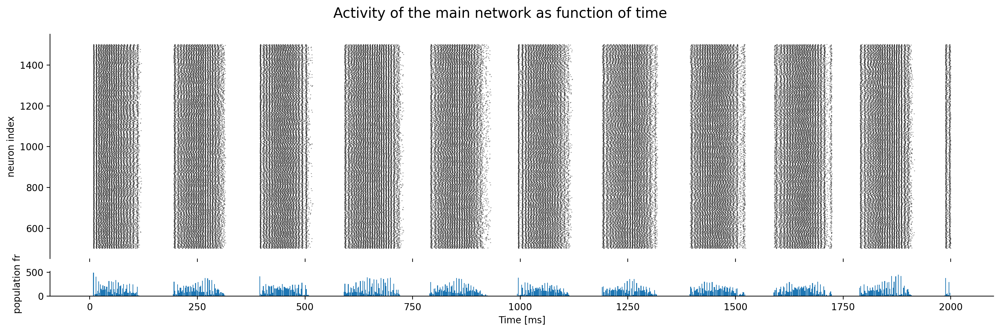

In [163]:
# graphical representation of the main network
fig,ax = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(15,5),
    dpi=200,
    gridspec_kw={"height_ratios":[0.9,0.1]},
    sharex=True
)

ax[0].plot(
    main_spks.events["times"],
    main_spks.events["senders"],
    "|", color="black",
    markersize=1,
    alpha=0.5
)

values, bins = np.histogram(
    main_spks.events["times"],
    bins=np.linspace(main_spks.events["times"].min(), main_spks.events["times"].max(), 1_000)
)

ax[1].bar(
    x=bins[:-1],
    height=values/(bins[1]-bins[0]),
    width=(bins[1]-bins[0])/1.1
)

ax[0].set_ylabel(r"neuron index")
ax[0].spines[["top","bottom","right"]].set_visible(False)

ax[1].set_ylabel(r"population fr")
ax[1].spines[["top","right"]].set_visible(False)

ax[-1].set_xlabel(r'Time [ms]')

fig.suptitle("Activity of the main network as function of time", size=15)

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "activity_main_network.pdf"), dpi=200)
plt.show()

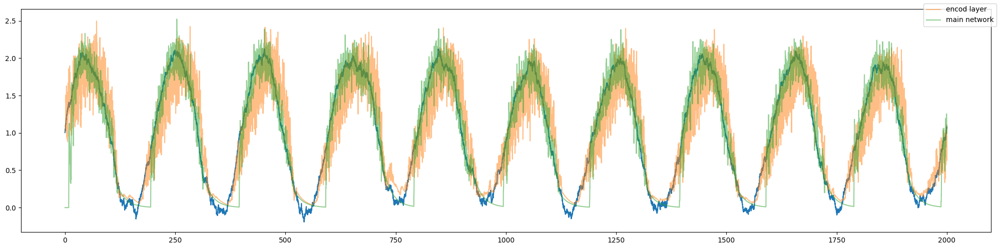

In [164]:
fig, ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(20,5)
)

ax.plot(
    time,
    sig
)

ax.plot(
    time,
    enc_estimate,
    alpha=0.5,
    label="encod layer"
)

ax.plot(
    time,
    main_estimate,
    alpha=0.5,
    label="main network"
)

# ax.set_xlim(0,1_000)
fig.legend()

plt.tight_layout()
plt.show()

In [165]:
from sklearn.decomposition import PCA

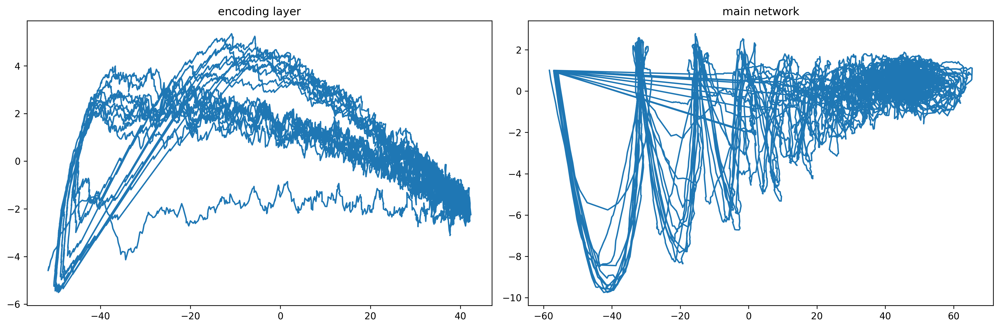

In [166]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15,5),
    dpi=300
)

for iX,X in enumerate([enc_states, main_states]):

    components = PCA(n_components=10).fit_transform(X.T)
    
    ax[iX].plot(
        components[:,0],
        components[:,1]
    )

ax[0].set_title("encoding layer")
ax[1].set_title("main network")

plt.tight_layout()
plt.show()

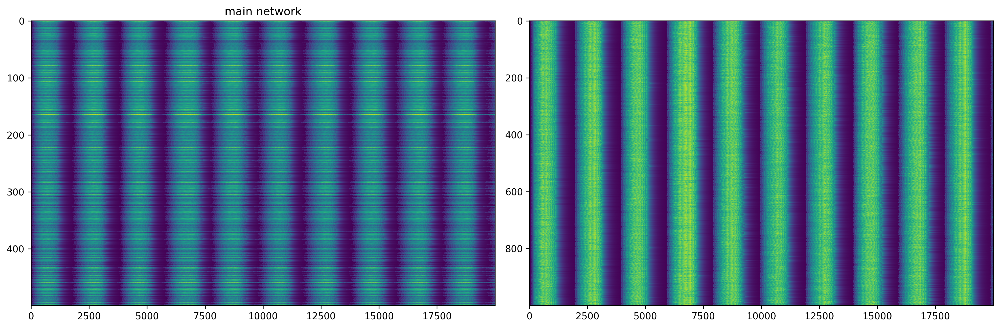

In [167]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15,5),
    dpi=300
)

for iX,X in enumerate([enc_states, main_states]):
    
    ax[iX].imshow(
        X,
        aspect="auto",
    )

ax[0].set_title("encoding layer")
ax[0].set_title("main network")

plt.tight_layout()
plt.show()

In [169]:
subsampling_factor = 1 # ms
max_lag = 100 # ms
step_lag = 5.0 / subsampling_factor

def compute_capacity_sequential(
    time_vector,
    signal,
    enc_states,
    ex_states,
    subsampling_factor,
    max_lag=100.0,
    step_lag=10,
    dt=0.1,
    verbose=False
):
    """

    Parameters
    ----------
    time_vector
    signal
    enc_states
    ex_states
    subsampling_factor
    max_lag : float
        Maximum lag / delay for which to evaluate memory capacity
    dt

    Returns
    -------

    """
    # Adjust the maximum lag and step lag based on the subsampling factor
    max_lag_subsampled = max_lag / subsampling_factor  # in milliseconds
    step_lag_subsampled = step_lag / subsampling_factor  # default step is 10 ms, scaled by subsampling factor

    # Create the array of time lags (subsampled) based on max_lag and step_lag
    time_lags = np.arange(dt, max_lag_subsampled, step_lag_subsampled)

    # Find indices in the time vector corresponding to these time lags
    indices = [np.where(time_vector == lag)[0][0] for lag in time_lags]

    # Compute the initial index for subsampling based on subsampling factor and dt
    initial_index = max(0, int(subsampling_factor * dt))

    # Generate the indices for subsampling the signal
    subsampling_indices = np.arange(initial_index, len(signal) + initial_index, subsampling_factor, dtype=int)

    # Subsample the signal using the generated indices
    subsampled_signal = signal[subsampling_indices]

    # Initialize lists to store capacities
    encoder_capacity = []
    circuit_capacity = []

    for shift, lag in zip(indices, time_lags):
        # shift the target signal
        if shift > 0:
            shifted_signal = subsampled_signal[:-shift]
        else:
            shifted_signal = subsampled_signal

        # shift the population states
        enc_st = enc_states[:, shift:]
        circ_st = ex_states[:, shift:]

        # compute capacity
        enc_estimate, enc_capacity, enc_error = compute_capacity(enc_st, shifted_signal)
        circ_estimate, circ_capacity, circ_error = compute_capacity(circ_st, shifted_signal)

        if verbose:
            print(f"Lag = {lag * subsampling_factor} ms")
            print(f"Encoding Layer: \n\t- Capacity={enc_capacity}, MSE={enc_error}")
            print(f"Main Circuit: \n\t- Capacity={circ_capacity}, MSE={circ_error}")

        encoder_capacity.append(enc_capacity)
        circuit_capacity.append(circ_capacity)

    return time_lags * subsampling_factor, encoder_capacity, circuit_capacity

In [170]:
time_capacity, encoder_capacity, main_capacity = compute_capacity_sequential(
    time_vector=time,
    signal=sig, 
    enc_states=enc_states,
    ex_states=main_states,
    subsampling_factor=subsampling_factor,
    max_lag=max_lag,
    step_lag=step_lag,
    dt=dt,
    verbose=True
)

Lag = 0.1 ms
Encoding Layer: 
	- Capacity=0.838320131650094, MSE=0.08193647482714207
Main Circuit: 
	- Capacity=0.9187756890459635, MSE=0.048299836708711956
Lag = 5.1 ms
Encoding Layer: 
	- Capacity=0.912810911644021, MSE=0.04432255443279449
Main Circuit: 
	- Capacity=0.9510842165281087, MSE=0.02738604717387715
Lag = 10.1 ms
Encoding Layer: 
	- Capacity=0.9645118509926895, MSE=0.018137055832333663
Main Circuit: 
	- Capacity=0.9738209620548544, MSE=0.013828300376925264
Lag = 15.1 ms
Encoding Layer: 
	- Capacity=0.9901622238737842, MSE=0.005111278072462282
Main Circuit: 
	- Capacity=0.9859993703383293, MSE=0.007193308596333325
Lag = 20.1 ms
Encoding Layer: 
	- Capacity=0.9877218723730232, MSE=0.006373104334250739
Main Circuit: 
	- Capacity=0.9906641964156747, MSE=0.004938132756847626
Lag = 25.1 ms
Encoding Layer: 
	- Capacity=0.9584310866815667, MSE=0.021355405186485092
Main Circuit: 
	- Capacity=0.990111229810829, MSE=0.005335652411209513
Lag = 30.1 ms
Encoding Layer: 
	- Capacity=0.906

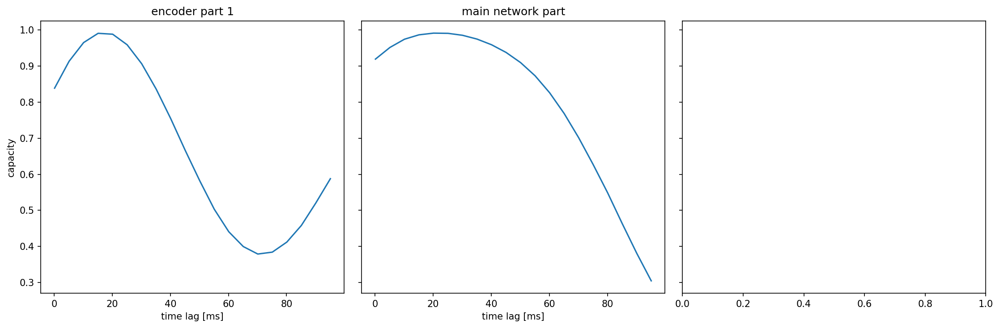

Total capacity (encoder): 67.41455032048475 ms
Total capacity (processor): 80.33662949528099 ms


In [171]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(15,5),
    dpi=150,
    sharey=True
)

ax[0].plot(
    time_capacity,
    encoder_capacity
)
ax[0].set_title("encoder part 1")
ax[0].set_ylabel("capacity")
ax[0].set_xlabel("time lag [ms]")

ax[1].plot(
    time_capacity,
    main_capacity
)
ax[1].set_title("main network part")
ax[1].set_xlabel("time lag [ms]")

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "memory_capacity.pdf"))
plt.show()

print(f"Total capacity (encoder): {np.sum(encoder_capacity)*step_lag} ms")
print(f"Total capacity (processor): {np.sum(main_capacity)*step_lag} ms")

## Data generation

In [12]:
frequency_range = np.linspace(1e-3, 1e-2, 3)
scale_range = np.linspace(0.5, 2, 3)
repet = 20

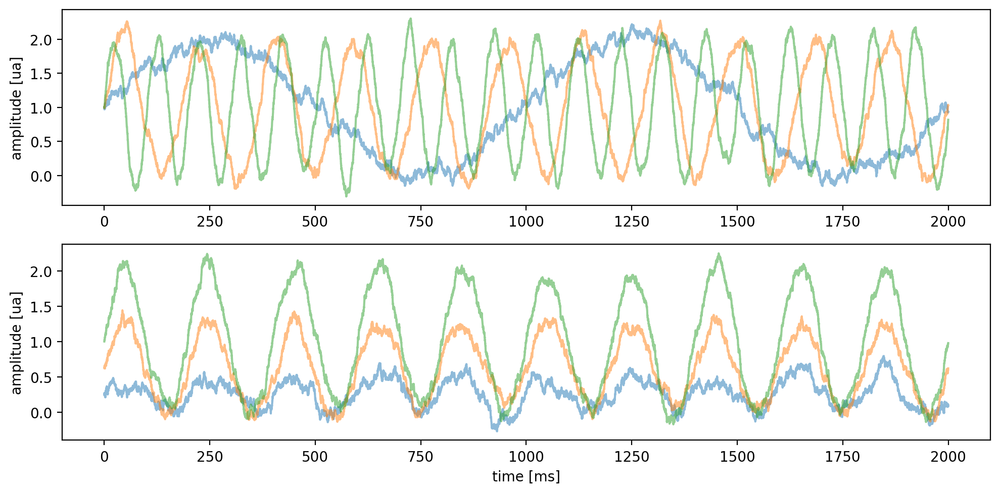

In [13]:
fig,ax = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(10,5),
    dpi=200
)

for f in frequency_range:
    
    time, sig, pre_sig = gen_stim(
        sim_time=sim_time, dt=dt,
        frequency=f
    )

    ax[0].plot(
        time,
        sig,
        alpha=0.5
    )

for s in scale_range:

    time, sig, pre_sig = gen_stim(
        sim_time=sim_time, dt=dt,
        scale=s
    )

    ax[1].plot(
        time,
        sig,
        alpha=0.5
    )

ax[0].set_ylabel("amplitude [ua]")
ax[1].set_ylabel("amplitude [ua]")
ax[1].set_xlabel("time [ms]")

plt.tight_layout()
plt.show()

In [14]:
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

In [15]:
stim = []
label = []

for n in tqdm(range(repet)):

    for f in frequency_range:
        
        for s in scale_range:

            time, sig, pre_sig = gen_stim(
                sim_time=sim_time, dt=dt,
                scale=s, frequency=f
            )

            stim.append(sig)
            label.append(f"freq{f:.3f}_scl{s}")

label = LabelEncoder().fit_transform(label)
stim = np.array(stim)

np.save(os.path.join(results_fodler_name, "stimuli", "stim"), stim)
np.save(os.path.join(results_fodler_name, "stimuli", "label"), label)
np.save(os.path.join(results_fodler_name, "stimuli", "time"), time)

100%|██████████| 20/20 [00:01<00:00, 10.13it/s]


## Record the network activity

In [307]:
stim.shape, label.shape, time.shape

((180, 19999), (180,), (19999,))

In [309]:
for i_stim in range(stim.shape[0]):

    # set general parameters
    seed = 1
    dt = 0.1
    num_threads = 16

    ####################################
    ###### initialize nest kernel ######
    ####################################

    nest.ResetKernel()
    nest.SetKernelStatus({
        'rng_seed': seed,
        'resolution': dt,
        'local_num_threads': num_threads
    })

    ####################################
    #### create the encoding layer #####
    ####################################

    enc_layer = nest.Create(
        model='iaf_psc_delta', 
        n=nEnc, 
        params={'I_e': J_bias}
    )

    # record the activity of the encoding layer 1
    enc_spks = nest.Create('spike_recorder')
    nest.Connect(enc_layer, enc_spks)

    ####################################
    ##### create the main network ######
    ####################################

    # population parameters
    NI = int(gamma * NE) # number of inhibitory neurons
    CI = int(gamma * CE) # indegree from inhibitory neurons

    # neuron paramters
    neuron_params = {
        'C_m': 1.0,            # membrane capacity (pF)
        'E_L': 0.,             # resting membrane potential (mV)
        'I_e': 0.,             # external input current (pA)
        'V_m': 0.,             # membrane potential (mV)
        'V_reset': 10.,        # reset membrane potential after a spike (mV)
        'V_th': 20.,           # spike threshold (mV)
        't_ref': 2.0,          # refractory period (ms)
        'tau_m': 20.,          # membrane time constant (ms)
    }

    # set default parameters for neurons and create neurons
    nest.SetDefaults('iaf_psc_delta', neuron_params)
    neurons_e = nest.Create('iaf_psc_delta', NE)
    neurons_i = nest.Create('iaf_psc_delta', NI)

    # create spike detectors
    main_spks = nest.Create('spike_recorder')

    # E synapses
    syn_exc = {'delay': d, 'weight': w}
    conn_exc = {'rule': 'fixed_indegree', 'indegree': CE}
    nest.Connect(neurons_e, neurons_e, conn_exc, syn_exc)
    nest.Connect(neurons_e, neurons_i, conn_exc, syn_exc)

    # I synapses
    syn_inh = {'delay': d, 'weight': - g * w}
    conn_inh = {'rule': 'fixed_indegree', 'indegree': CI}
    nest.Connect(neurons_i, neurons_e, conn_inh, syn_inh)
    nest.Connect(neurons_i, neurons_i, conn_inh, syn_inh)

    # spike detector
    nest.Connect(neurons_e, main_spks)

    # connect the encoding layer to both neuronal population
    nest.Connect(enc_layer, neurons_e, conn_exc, syn_exc)
    nest.Connect(enc_layer, neurons_i, conn_exc, syn_exc)
    
    ###################################
    # connect input to encoding layer #
    ###################################

    sig = stim[i_stim,:]
    
    # encoding layer 1 reparametrisation
    tuning = 250. * np.random.randn(nEnc) + 1000. # 
    thresholds = 5 * np.random.randn(nEnc) - 50. # generate some heterogeneity on the population
    thresholds = np.maximum(thresholds, -65.) # 
    Vm0 = np.array(np.random.uniform(low=-70., high=-50., size=int(nEnc))) # randomized initiate point of each neuron

    step_generator = nest.Create(
        model='step_current_generator', 
        n=nEnc
    )

    amplitudes = np.zeros((nEnc, len(sig)))

    for n in range(nEnc): # for each neuron in the encoding layer
        
        # transform the input as function of the tuning of each neuron
        amplitudes[n, :] = sig * tuning[n]
        
        # change parameters of each neuron in the input layer
        enc_layer[n].set(
            {
                'V_m': Vm0[n], # set the membrane potential initialisation
                'V_th': thresholds[n] # set the excitation threshold
            }
        )

        # change caracteristics of the input generator
        step_generator[n].set(
            {
                'amplitude_times': time, # set the time
                'amplitude_values': amplitudes[n] # set the amplitude
            }
        )

        # connect the input generator to the encoding layer neuron one-by-one
        nest.Connect(
            step_generator[n],
            enc_layer[n]
        )

    ##########################################
    # run the simulation and extrac activity #
    ##########################################

    nest.Simulate(sim_time)

    main_activity = main_spks.events
    main_states = filter_spikes_parallel(
        main_activity['times'], main_activity['senders'], 
        NE, 
        t_start=dt, t_stop=sim_time, dt=dt, 
        tau=filter_tau, 
        n_processes=num_threads
    )

    np.save(os.path.join(results_fodler_name, "activities", f"{i_stim}_mai_activity"), main_states)


Oct 21 23:50:48 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:50:50 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:50:50 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:50:54 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 69.56it/s]



Oct 21 23:51:09 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:51:11 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:51:11 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:51:14 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 69.29it/s]



Oct 21 23:51:30 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:51:32 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:51:32 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:51:36 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 68.92it/s]



Oct 21 23:51:51 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:51:53 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:51:53 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:51:57 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 68.29it/s]



Oct 21 23:52:12 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:52:14 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:52:14 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:52:18 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.43it/s]



Oct 21 23:52:34 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:52:36 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:52:36 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:52:39 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.77it/s]



Oct 21 23:52:55 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:52:57 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:52:57 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:53:00 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.34it/s]



Oct 21 23:53:16 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:53:18 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:53:18 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:53:22 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.85it/s]



Oct 21 23:53:38 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:53:40 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:53:40 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:53:44 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.66it/s]



Oct 21 23:54:00 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:54:02 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:54:02 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:54:05 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.74it/s]



Oct 21 23:54:21 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:54:23 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:54:23 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:54:26 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.86it/s]



Oct 21 23:54:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:54:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:54:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:54:48 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.83it/s]



Oct 21 23:55:04 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:55:06 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:55:06 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:55:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.72it/s]



Oct 21 23:55:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:55:27 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:55:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:55:30 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.63it/s]



Oct 21 23:55:46 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:55:48 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:55:48 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:55:52 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.00it/s]



Oct 21 23:56:08 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:56:10 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:56:10 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:56:13 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 68.00it/s]



Oct 21 23:56:29 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:56:31 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:56:31 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:56:34 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.62it/s]



Oct 21 23:56:50 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:56:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:56:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:56:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.42it/s]



Oct 21 23:57:12 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:57:14 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:57:14 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:57:17 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 59.63it/s]



Oct 21 23:57:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:57:37 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:57:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:57:40 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.47it/s]



Oct 21 23:57:56 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:57:58 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:57:58 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:58:02 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 68.07it/s]



Oct 21 23:58:17 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:58:19 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:58:19 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:58:23 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.93it/s]



Oct 21 23:58:38 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:58:40 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:58:40 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:58:44 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.66it/s]



Oct 21 23:59:00 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:59:02 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:59:02 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:59:05 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.55it/s]



Oct 21 23:59:21 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:59:23 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:59:23 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:59:27 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.76it/s]



Oct 21 23:59:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 21 23:59:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 21 23:59:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 21 23:59:48 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.13it/s]



Oct 22 00:00:04 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:00:06 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:00:06 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:00:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.80it/s]



Oct 22 00:00:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:00:27 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:00:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:00:30 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.43it/s]



Oct 22 00:00:46 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:00:48 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:00:48 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:00:52 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.15it/s]



Oct 22 00:01:08 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:01:10 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:01:10 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:01:14 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.66it/s]



Oct 22 00:01:30 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:01:31 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:01:31 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:01:35 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.72it/s]



Oct 22 00:01:51 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:01:53 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:01:53 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:01:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.05it/s]



Oct 22 00:02:13 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:02:16 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:02:16 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:02:19 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.55it/s]



Oct 22 00:02:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:02:37 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:02:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:02:40 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.50it/s]



Oct 22 00:02:56 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:02:58 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:02:58 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:03:02 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.70it/s]



Oct 22 00:03:18 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:03:20 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:03:20 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:03:23 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.37it/s]



Oct 22 00:03:39 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:03:41 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:03:41 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:03:45 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.81it/s]



Oct 22 00:04:01 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:04:03 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:04:03 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:04:06 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.39it/s]



Oct 22 00:04:22 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:04:24 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:04:24 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:04:28 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.82it/s]



Oct 22 00:04:44 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:04:46 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:04:46 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:04:49 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.52it/s]



Oct 22 00:05:06 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:05:08 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:05:08 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:05:11 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.04it/s]



Oct 22 00:05:27 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:05:29 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:05:29 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:05:33 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.33it/s]



Oct 22 00:05:51 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:05:53 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:05:53 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:05:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.74it/s]



Oct 22 00:06:13 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:06:15 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:06:16 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:06:19 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:17<00:00, 56.72it/s]



Oct 22 00:06:38 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:06:40 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:06:40 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:06:44 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:17<00:00, 58.62it/s]



Oct 22 00:07:03 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:07:05 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:07:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:07:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.08it/s]



Oct 22 00:07:26 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:07:29 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:07:29 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:07:34 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 59.59it/s]



Oct 22 00:07:52 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:07:54 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:07:54 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:07:58 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:18<00:00, 52.90it/s]



Oct 22 00:08:18 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:08:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:08:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:08:25 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.87it/s]



Oct 22 00:08:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:08:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:08:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:08:47 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.80it/s]



Oct 22 00:09:05 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:09:07 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:09:07 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:09:11 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.59it/s]



Oct 22 00:09:29 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:09:31 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:09:31 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:09:34 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.72it/s]



Oct 22 00:09:50 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:09:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:09:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:09:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.53it/s]



Oct 22 00:10:12 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:10:14 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:10:14 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:10:18 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.47it/s]



Oct 22 00:10:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:10:37 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:10:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:10:41 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.29it/s]



Oct 22 00:10:58 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:11:00 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:11:00 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:11:03 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.08it/s]



Oct 22 00:11:21 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:11:23 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:11:23 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:11:28 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.81it/s]



Oct 22 00:11:44 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:11:47 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:11:47 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:11:50 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.48it/s]



Oct 22 00:12:07 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:12:10 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:12:10 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:12:14 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 59.20it/s]



Oct 22 00:12:32 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:12:34 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:12:34 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:12:39 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 62.33it/s]



Oct 22 00:12:56 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:12:58 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:12:58 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:13:02 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.07it/s]



Oct 22 00:13:19 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:13:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:13:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:13:24 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.22it/s]



Oct 22 00:13:41 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:13:43 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:13:43 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:13:47 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.12it/s]



Oct 22 00:14:04 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:14:06 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:14:06 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:14:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.18it/s]



Oct 22 00:14:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:14:27 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:14:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:14:31 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.12it/s]



Oct 22 00:14:48 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:14:50 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:14:50 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:14:54 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.11it/s]



Oct 22 00:15:10 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:15:12 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:15:12 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:15:16 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.52it/s]



Oct 22 00:15:32 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:15:34 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:15:34 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:15:38 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.70it/s]



Oct 22 00:15:55 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:15:57 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:15:57 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:16:01 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.98it/s]



Oct 22 00:16:18 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:16:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:16:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:16:24 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 59.44it/s]



Oct 22 00:16:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:16:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:16:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:16:48 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.30it/s]



Oct 22 00:17:05 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:17:07 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:17:07 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:17:11 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.29it/s]



Oct 22 00:17:28 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:17:30 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:17:30 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:17:34 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.06it/s]



Oct 22 00:17:51 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:17:53 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:17:53 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:17:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.44it/s]



Oct 22 00:18:13 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:18:15 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:18:15 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:18:19 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.27it/s]



Oct 22 00:18:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:18:38 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:18:38 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:18:41 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.91it/s]



Oct 22 00:18:57 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:18:59 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:18:59 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:19:03 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.58it/s]



Oct 22 00:19:19 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:19:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:19:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:19:25 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.27it/s]



Oct 22 00:19:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:19:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:19:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:19:47 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.72it/s]



Oct 22 00:20:03 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:20:05 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:20:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:20:08 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.29it/s]



Oct 22 00:20:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:20:26 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:20:26 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:20:30 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.11it/s]



Oct 22 00:20:46 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:20:48 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:20:48 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:20:52 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.75it/s]



Oct 22 00:21:09 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:21:11 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:21:11 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:21:15 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.80it/s]



Oct 22 00:21:31 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:21:33 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:21:33 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:21:37 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.76it/s]



Oct 22 00:21:53 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:21:55 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:21:55 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:21:58 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.60it/s]



Oct 22 00:22:14 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:22:16 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:22:16 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:22:20 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.92it/s]



Oct 22 00:22:36 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:22:38 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:22:38 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:22:43 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.20it/s]



Oct 22 00:23:00 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:23:02 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:23:02 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:23:05 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.70it/s]



Oct 22 00:23:22 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:23:25 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:23:25 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:23:29 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 62.47it/s]



Oct 22 00:23:46 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:23:48 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:23:48 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:23:53 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.33it/s]



Oct 22 00:24:09 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:24:11 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:24:11 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:24:16 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 59.39it/s]



Oct 22 00:24:34 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:24:36 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:24:36 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:24:39 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.10it/s]



Oct 22 00:24:56 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:24:58 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:24:58 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:25:02 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.61it/s]



Oct 22 00:25:19 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:25:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:25:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:25:26 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.82it/s]



Oct 22 00:25:44 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:25:46 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:25:46 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:25:50 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 62.10it/s]



Oct 22 00:26:07 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:26:09 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:26:09 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:26:13 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.95it/s]



Oct 22 00:26:30 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:26:32 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:26:32 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:26:36 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.01it/s]



Oct 22 00:26:53 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:26:55 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:26:55 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:26:59 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.58it/s]



Oct 22 00:27:17 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:27:19 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:27:19 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:27:23 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 61.63it/s]



Oct 22 00:27:41 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:27:43 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:27:43 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:27:47 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.53it/s]



Oct 22 00:28:03 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:28:05 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:28:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:28:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.97it/s]



Oct 22 00:28:26 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:28:28 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:28:28 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:28:33 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.07it/s]



Oct 22 00:28:50 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:28:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:28:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:28:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.51it/s]



Oct 22 00:29:12 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:29:14 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:29:14 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:29:19 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.70it/s]



Oct 22 00:29:36 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:29:38 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:29:38 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:29:42 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.50it/s]



Oct 22 00:29:59 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:30:01 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:30:02 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:30:05 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.88it/s]



Oct 22 00:30:22 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:30:24 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:30:24 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:30:28 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:17<00:00, 58.72it/s]



Oct 22 00:30:46 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:30:48 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:30:49 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:30:52 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.38it/s]



Oct 22 00:31:10 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:31:13 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:31:13 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:31:17 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.08it/s]



Oct 22 00:31:33 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:31:35 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:31:35 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:31:39 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.18it/s]



Oct 22 00:31:57 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:31:59 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:31:59 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:32:03 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.07it/s]



Oct 22 00:32:20 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:32:22 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:32:22 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:32:26 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.16it/s]



Oct 22 00:32:43 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:32:45 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:32:45 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:32:48 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.87it/s]



Oct 22 00:33:05 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:33:07 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:33:08 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:33:12 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.81it/s]



Oct 22 00:33:28 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:33:30 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:33:30 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:33:34 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.38it/s]



Oct 22 00:33:50 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:33:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:33:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:33:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.89it/s]



Oct 22 00:34:12 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:34:14 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:34:14 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:34:18 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.94it/s]



Oct 22 00:34:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:34:37 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:34:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:34:40 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.05it/s]



Oct 22 00:34:57 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:34:59 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:34:59 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:35:02 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.16it/s]



Oct 22 00:35:18 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:35:20 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:35:20 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:35:24 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.87it/s]



Oct 22 00:35:41 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:35:43 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:35:43 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:35:46 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.16it/s]



Oct 22 00:36:03 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:36:05 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:36:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:36:08 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.56it/s]



Oct 22 00:36:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:36:27 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:36:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:36:31 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.15it/s]



Oct 22 00:36:47 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:36:49 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:36:49 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:36:53 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.34it/s]



Oct 22 00:37:10 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:37:12 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:37:12 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:37:16 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.79it/s]



Oct 22 00:37:32 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:37:34 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:37:34 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:37:39 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.49it/s]



Oct 22 00:37:56 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:37:58 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:37:58 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:38:02 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.24it/s]



Oct 22 00:38:18 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:38:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:38:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:38:25 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.97it/s]



Oct 22 00:38:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:38:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:38:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:38:48 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.33it/s]



Oct 22 00:39:05 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:39:07 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:39:07 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:39:10 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.88it/s]



Oct 22 00:39:27 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:39:29 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:39:29 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:39:33 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.11it/s]



Oct 22 00:39:50 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:39:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:39:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:39:56 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.17it/s]



Oct 22 00:40:13 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:40:15 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:40:15 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:40:19 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.40it/s]



Oct 22 00:40:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:40:37 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:40:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:40:41 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.30it/s]



Oct 22 00:40:58 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:41:00 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:41:00 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:41:05 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.67it/s]



Oct 22 00:41:21 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:41:23 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:41:23 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:41:27 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.41it/s]



Oct 22 00:41:44 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:41:46 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:41:46 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:41:49 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.56it/s]



Oct 22 00:42:06 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:42:08 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:42:08 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:42:12 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.90it/s]



Oct 22 00:42:28 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:42:30 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:42:30 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:42:33 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.76it/s]



Oct 22 00:42:50 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:42:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:42:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:42:55 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.94it/s]



Oct 22 00:43:11 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:43:13 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:43:13 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:43:17 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.53it/s]



Oct 22 00:43:34 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:43:36 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:43:36 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:43:40 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.22it/s]



Oct 22 00:43:56 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:43:58 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:43:59 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:44:03 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.92it/s]



Oct 22 00:44:19 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:44:21 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:44:21 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:44:25 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.53it/s]



Oct 22 00:44:42 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:44:44 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:44:44 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:44:48 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.32it/s]



Oct 22 00:45:04 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:45:06 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:45:06 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:45:10 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.01it/s]



Oct 22 00:45:26 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:45:28 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:45:28 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:45:32 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.48it/s]



Oct 22 00:45:48 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:45:50 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:45:50 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:45:53 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.32it/s]



Oct 22 00:46:09 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:46:11 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:46:11 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:46:15 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.44it/s]



Oct 22 00:46:31 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:46:33 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:46:33 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:46:37 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.77it/s]



Oct 22 00:46:53 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:46:56 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:46:56 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:47:00 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.44it/s]



Oct 22 00:47:17 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:47:19 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:47:19 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:47:23 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.85it/s]



Oct 22 00:47:39 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:47:42 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:47:42 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:47:46 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.59it/s]



Oct 22 00:48:03 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:48:05 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:48:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:48:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.86it/s]



Oct 22 00:48:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:48:27 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:48:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:48:31 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.63it/s]



Oct 22 00:48:47 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:48:49 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:48:49 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:48:53 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.46it/s]



Oct 22 00:49:10 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:49:12 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:49:12 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:49:15 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.41it/s]



Oct 22 00:49:32 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:49:34 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:49:34 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:49:38 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.34it/s]



Oct 22 00:49:54 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:49:56 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:49:56 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:50:00 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.20it/s]



Oct 22 00:50:16 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:50:18 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:50:18 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:50:22 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.41it/s]



Oct 22 00:50:38 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:50:40 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:50:40 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:50:44 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.78it/s]



Oct 22 00:51:00 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:51:02 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:51:02 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:51:06 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.50it/s]



Oct 22 00:51:23 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:51:25 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:51:25 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:51:28 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.61it/s]



Oct 22 00:51:44 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:51:47 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:51:47 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:51:50 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.23it/s]



Oct 22 00:52:06 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:52:08 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:52:09 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:52:13 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.95it/s]



Oct 22 00:52:29 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:52:31 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:52:31 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:52:35 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.23it/s]



Oct 22 00:52:51 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:52:53 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:52:53 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:52:58 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 62.65it/s]



Oct 22 00:53:15 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:53:17 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:53:17 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:53:22 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.04it/s]



Oct 22 00:53:39 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:53:41 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:53:41 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:53:45 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.29it/s]



Oct 22 00:54:02 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:54:05 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:54:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:54:09 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 65.75it/s]



Oct 22 00:54:25 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:54:27 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:54:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:54:31 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 64.73it/s]



Oct 22 00:54:48 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:54:50 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:54:50 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:54:54 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 60.89it/s]



Oct 22 00:55:12 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:55:14 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:55:14 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:55:18 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.25it/s]



Oct 22 00:55:35 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:55:37 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:55:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:55:42 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:16<00:00, 62.16it/s]



Oct 22 00:55:59 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:56:01 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:56:01 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:56:05 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.18it/s]



Oct 22 00:56:21 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:56:23 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:56:23 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:56:27 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 66.03it/s]



Oct 22 00:56:44 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:56:46 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:56:46 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:56:49 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.25it/s]



Oct 22 00:57:05 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:57:07 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:57:07 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:57:11 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:15<00:00, 63.56it/s]



Oct 22 00:57:28 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:57:30 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:57:30 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:57:33 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 67.54it/s]



Oct 22 00:57:49 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Oct 22 00:57:52 NodeManager::prepare_nodes [Info]: 
    Preparing 9782 nodes for simulation.

Oct 22 00:57:52 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 9782
    Simulation time (ms): 2000
    Number of OpenMP threads: 16
    Number of MPI processes: 1

Oct 22 00:57:55 SimulationManager::run [Info]: 
    Simulation finished.


Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:14<00:00, 66.85it/s]


## Go to decod this

In [7]:
# for the decoding we have to move to the windows part